In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

change to whatever your path is to the part1-GANs folder

In [2]:
# %cd "drive/MyDrive/homework4/part1-GANs"

In [3]:

%load_ext autoreload
%autoreload 2

# Homework 4: Part 1 - Generative Adversarial Networks (GANs) [9 pts]

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short).

In a GAN, there are two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$) and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will alternate between taking gradient *descent* steps on the objective for $G$ and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__.
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661).

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

In [4]:
# Setup cell.
import numpy as np
import torch
import torch.nn as nn
from torch.nn import init
import torchvision
import torchvision.transforms as T
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler
import torchvision.datasets as dataset
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import sys
sys.path.append("part1_GANS")

# # # import os
# # # # home_dir = os.path.dirname(os.path.abspath('hw4-part1.ipynb'))
# # # home_dir = '/home/anascimento7/CS7643/Assignments/hw4_code_student_version'
# # # print(home_dir)
# # # # gans_dir = os.path.join(home_dir, 'part1-GANs')
# # # sys.path.append(home_dir)
# # # print(home_dir)

from part1_GANs.gan_pytorch import preprocess_img, deprocess_img, rel_error, count_params, ChunkSampler

dtype = torch.cuda.FloatTensor if torch.cuda.is_available() else torch.FloatTensor

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # Set default size of plots.
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'


def show_images(images):
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        # If the image is in the shape (3, 32, 32), use transpose to change it to (32, 32, 3).
        if img.shape[0] == 3:
            img = np.transpose(img, (1, 2, 0))
        plt.imshow(img)
        # plt.show()

    return

## Dataset

We are going to be using SVHN (Street View and House Number Dataset)

Link: http://ufldl.stanford.edu/housenumbers/

<!-- ![Dataset Representation](images/svhn_data_sample.png) -->
<!--
<img src = "../assets/svhn_data_sample.png"> -->

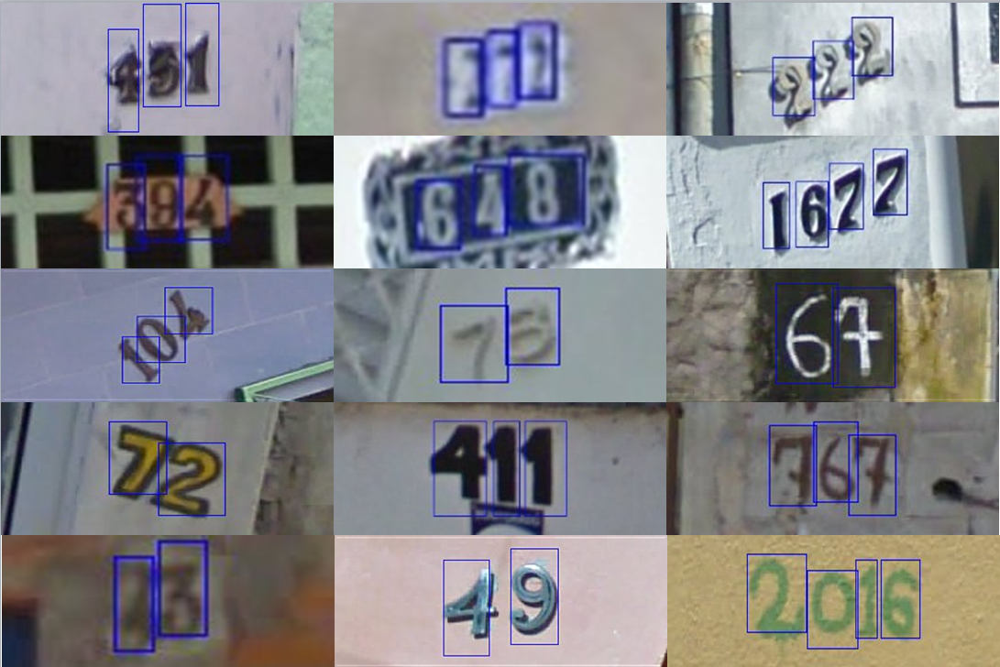

Using downloaded and verified file: datasets/svhn/train_32x32.mat
73257
Using downloaded and verified file: datasets/svhn/test_32x32.mat
26032
torch.Size([128, 3, 32, 32])


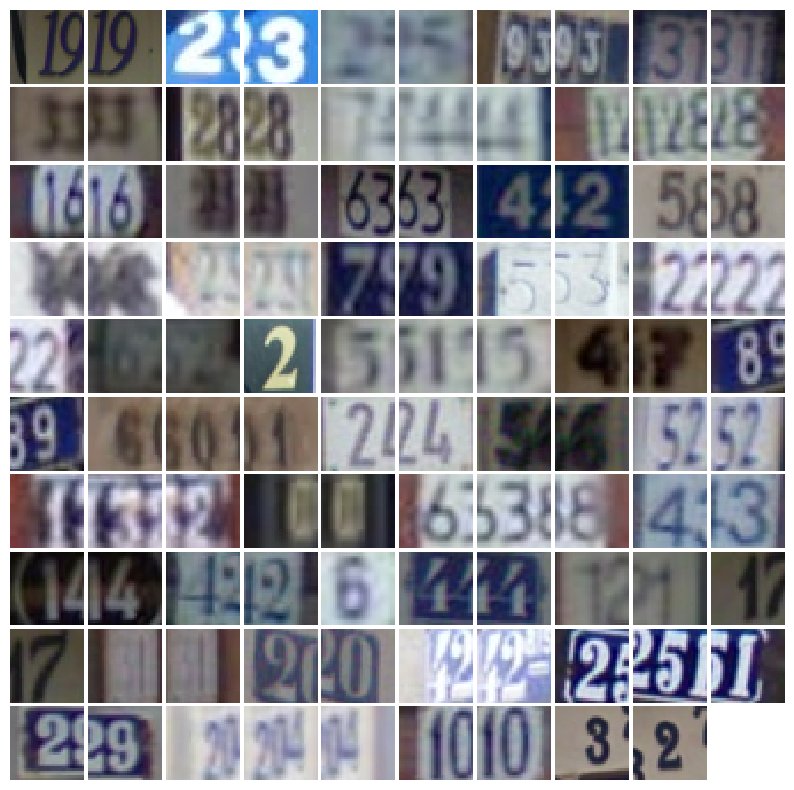

In [5]:
# NUM_TRAIN = 73257
# NUM_VAL = 26032

NOISE_DIM = 96
batch_size = 128
val_batch_size = 128

svhn_train = dataset.SVHN(
    'datasets/svhn',
    split="train",
    download=True,
    transform=T.ToTensor()
)
loader_train = DataLoader(
    svhn_train,
    batch_size=batch_size,
    sampler=ChunkSampler(len(svhn_train), 0)
)

print(len(svhn_train))

svhn_val = dataset.SVHN(
    'datasets/svhn',
    split="test",
    download=True,
    transform=T.ToTensor()
)

print(len(svhn_val))

loader_val = DataLoader(
    svhn_val,
    batch_size=val_batch_size,
    sampler=ChunkSampler(len(svhn_val), 0)
)

iterator = iter(loader_train)
imgs, labels = next(iterator)
print(imgs.shape)
# imgs = imgs.view(batch_size, 3072).numpy().squeeze()
show_images(imgs[0:99])

## TODO: Random Noise [1pts]

Generate uniform noise from -1 to 1 with shape `[batch_size, dim]`.

Implement `sample_noise` in `gan_pytorch.py`.

Hint: use `torch.rand`.

Make sure noise is the correct shape and type:

In [6]:
from part1_GANs.gan_pytorch import sample_noise
from part1_GANs.gan_pytorch import Flatten, Unflatten, initialize_weights

def test_sample_noise():
    batch_size = 3
    dim = 4
    torch.manual_seed(6476)
    z = sample_noise(batch_size, dim)
    np_z = z.cpu().numpy()
    assert np_z.shape == (batch_size, dim)
    assert torch.is_tensor(z)
    assert np.all(np_z >= -1.0) and np.all(np_z <= 1.0)
    assert np.any(np_z < 0.0) and np.any(np_z > 0.0)
    print('All tests passed!')

test_sample_noise()

All tests passed!


# TODO: Discriminator [0.5 pts]

GAN is composed of a discriminator and generator. The discriminator differentiates between a real and fake image. Let us create the architecture for it. In `gan_pytorch.py`, fill in the architecture as part of the `nn.Sequential` constructor in the function below. All fully connected layers should include bias terms.

The recommendation for discriminator architecture is to have 1-2 Conv2D blocks, and a fully connected layer after that.

Recall that the Leaky ReLU nonlinearity computes $f(x) = \max(\alpha x, x)$ for some fixed constant $\alpha$; for the LeakyReLU nonlinearities in the architecture above we set $\alpha=0.01$.

The output of the discriminator should have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [7]:
from part1_GANs.gan_pytorch import discriminator

def test_discriminator():
    model = discriminator()
    cur_count = count_params(model)
    print('Number of parameters in discriminator: ', cur_count)

test_discriminator()

Number of parameters in discriminator:  142529


## TODO: Generator [0.5 pts]

Recommendation for the generator is to have some fully connected layer followed by 1-2 ConvTranspose2D (It is also known as a fractionally-strided convolution). Remeber to use activation functions such as ReLU, Leaky RelU, etc. Finally use nn.Tanh() to finally output between [-1, 1].

The output of a generator should be the image. Therefore the shape will be `[batch_size, 3, 32, 32]`.

In [8]:
from part1_GANs.gan_pytorch import generator

def test_generator():
    model = generator()
    cur_count = count_params(model)
    print('Number of parameters in generator: ', cur_count)

test_generator()

Number of parameters in generator:  2119811


## TODO: Implement the Discriminator and Generator Loss Function [3 pts]

This will be the Vanilla GAN loss function which involves the Binary Cross Entropy Loss. Fill the ```bce_loss```, ```discriminator_loss```, and ```generator_loss```. The errors should be less than 5e-5.

In [9]:
from part1_GANs.gan_pytorch import bce_loss, discriminator_loss, generator_loss

# import os
# print(os.getcwd())

# answers = dict(np.load('../test_resources/gan-checks.npz')) #ORIGINAL
answers = dict(np.load('test_resources/gan-checks.npz'))

def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(torch.Tensor(logits_real).type(dtype),
                                torch.Tensor(logits_fake).type(dtype)).cpu()
    # print(d_loss, d_loss_true)
    assert torch.allclose(torch.Tensor(d_loss_true), torch.Tensor(d_loss), rtol=1e-05, atol=1e-08, equal_nan=False)
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss.numpy()))

def test_generator_loss():
    sample_logits = torch.tensor([0.0, 0.5, 0.4, 0.1])
    g_loss = generator_loss(torch.Tensor(sample_logits).type(dtype)).cpu().numpy()
    assert torch.allclose(torch.Tensor([0.581159]), torch.Tensor(g_loss), rtol=1e-05, atol=1e-08, equal_nan=False)
    print("Maximum error in d_loss: %g"%rel_error(0.581159, g_loss.item()))

def test_bce_loss():
    input = torch.tensor([0.4, 0.1, 0.2, 0.3])
    target = torch.tensor([0.3, 0.25, 0.25, 0.2])
    bc_loss = bce_loss(input, target).item()
    # print('BC LOSS', bc_loss)
    assert torch.allclose(torch.Tensor([0.7637264728546143]), torch.Tensor([bc_loss]), rtol=1e-04, atol=1e-08, equal_nan=False)
    print("Maximum error in d_loss: %g"%rel_error(0.7637264728546143, bc_loss))

test_discriminator_loss(
    answers['logits_real'],
    answers['logits_fake'],
    answers['d_loss_true']
)

test_generator_loss()

test_bce_loss()

Maximum error in d_loss: 3.97058e-09
Maximum error in d_loss: 3.76114e-09
Maximum error in d_loss: 0


In [10]:
## All imports done in the test cells

from part1_GANs.gan_pytorch import sample_noise
from part1_GANs.gan_pytorch import Flatten, Unflatten, initialize_weights
from part1_GANs.gan_pytorch import discriminator
from part1_GANs.gan_pytorch import generator
from part1_GANs.gan_pytorch import bce_loss, discriminator_loss, generator_loss

## Now let's complete the GAN

Fill the training function `train_gan` and make sure to complete the `get_optimizer`. Adam is a good recommendation for the optimizer.

The top batch of images shown are the outputs from your generator.  The bottom batch of images are the real inputs that the discriminator recieves along with your generated images.

Iter: 0, D: 1.406, G:0.6583


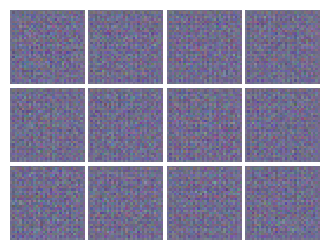

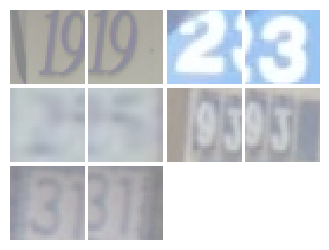

Iter: 250, D: 1.407, G:2.0


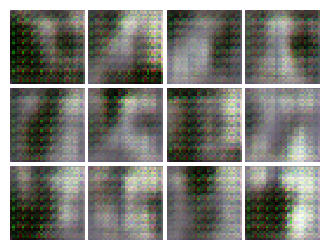

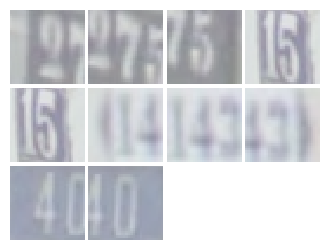

Iter: 500, D: 1.364, G:0.7755


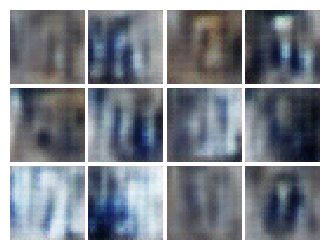

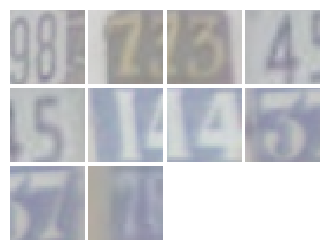

Iter: 750, D: 1.385, G:0.7612


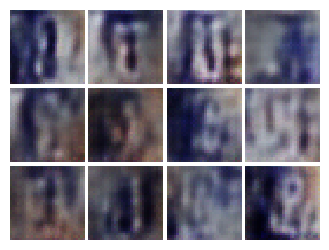

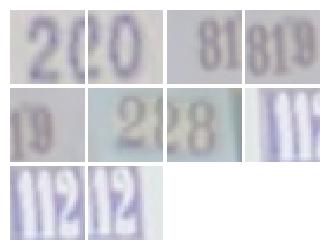

Iter: 1000, D: 1.378, G:0.7332


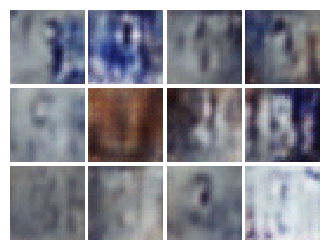

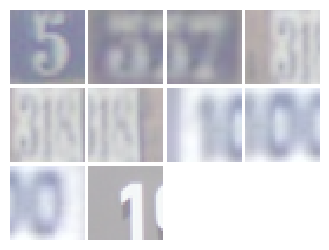

Iter: 1250, D: 1.378, G:0.6858


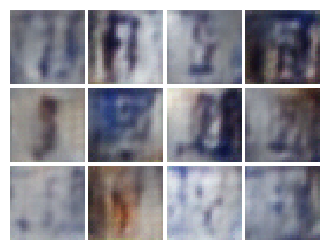

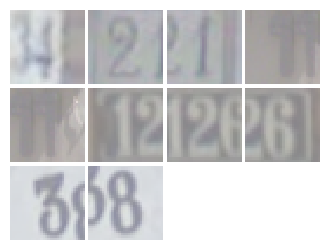

Iter: 1500, D: 1.374, G:0.6971


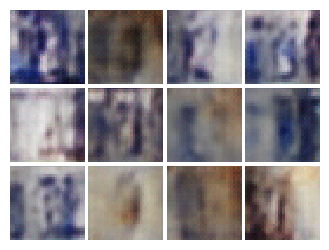

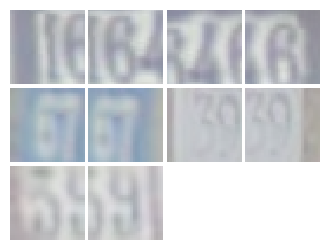

Iter: 1750, D: 1.295, G:0.8224


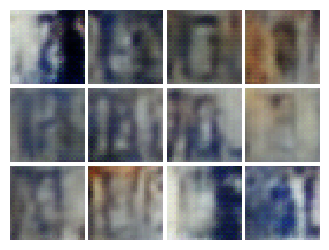

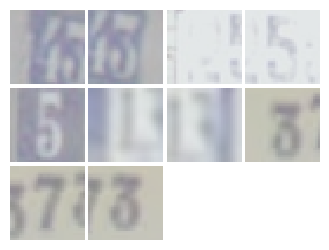

Iter: 2000, D: 1.348, G:0.7771


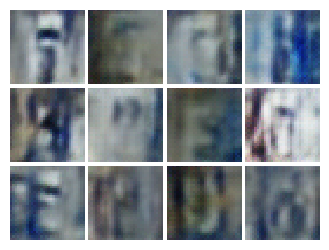

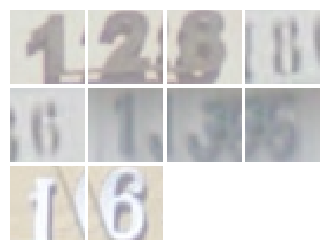

Iter: 2250, D: 1.437, G:0.8087


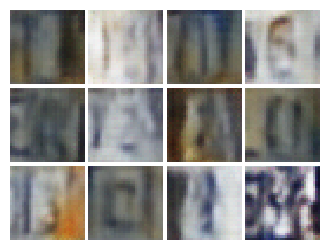

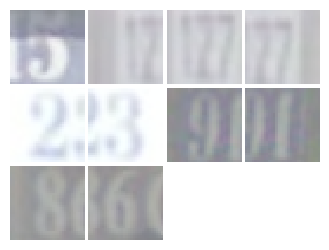

Iter: 2500, D: 1.322, G:0.813


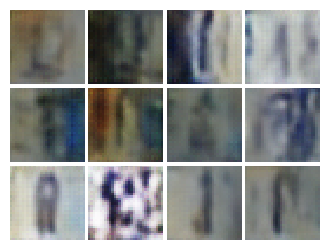

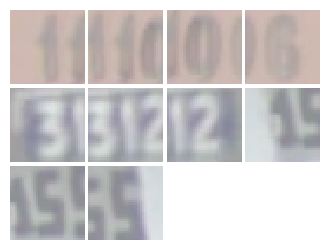

Iter: 2750, D: 1.358, G:0.8221


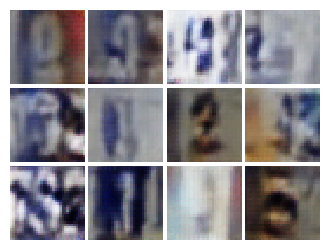

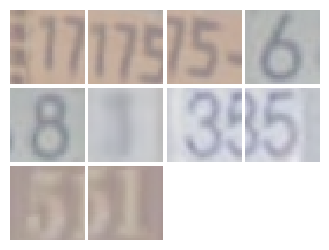

Iter: 3000, D: 1.272, G:0.982


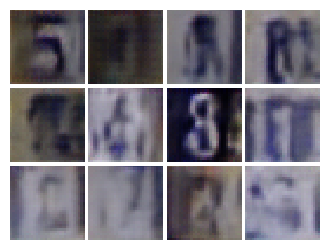

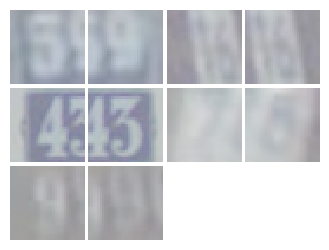

Iter: 3250, D: 1.308, G:0.8209


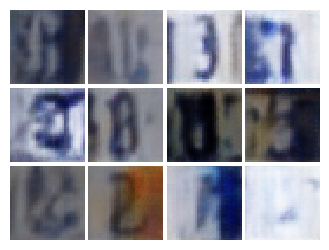

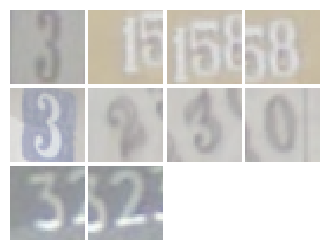

Iter: 3500, D: 1.238, G:0.8639


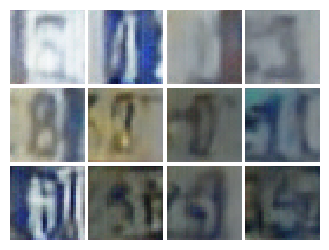

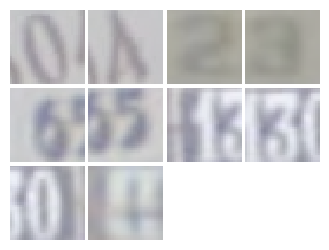

Iter: 3750, D: 1.273, G:0.824


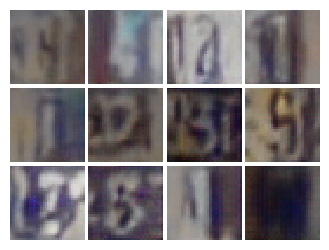

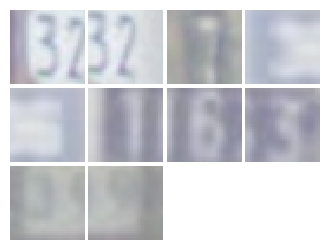

Iter: 4000, D: 1.29, G:0.9372


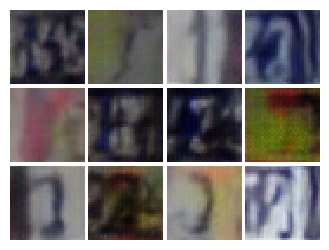

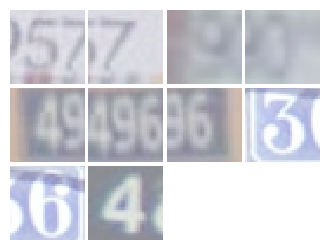

Iter: 4250, D: 1.207, G:0.8816


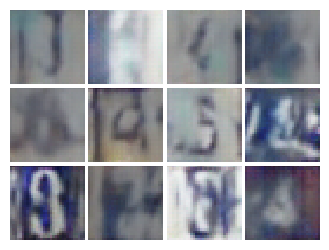

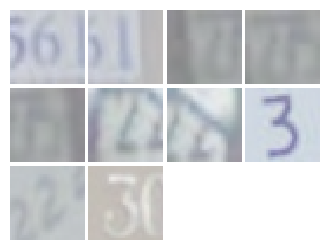

Iter: 4500, D: 1.28, G:0.8989


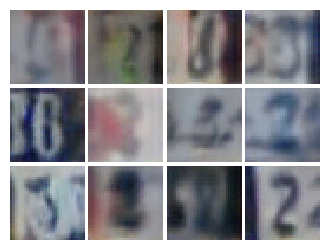

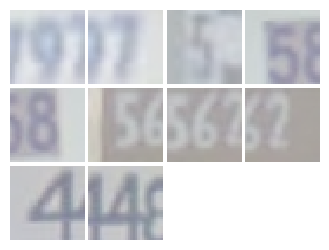

Iter: 4750, D: 1.257, G:0.8389


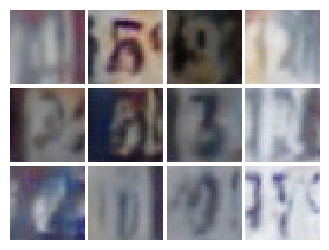

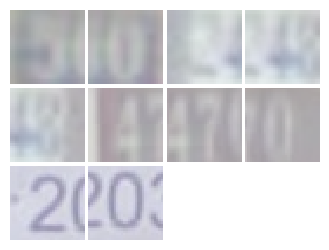

Iter: 5000, D: 1.262, G:0.9054


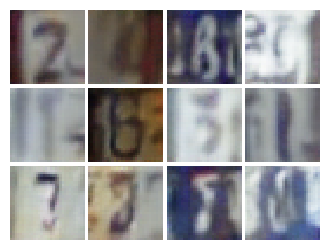

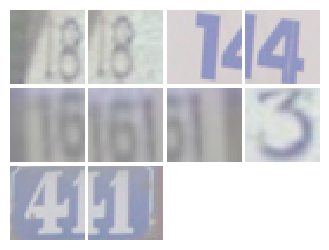

Iter: 5250, D: 1.287, G:0.9182


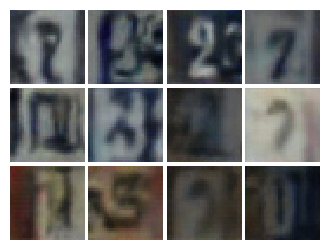

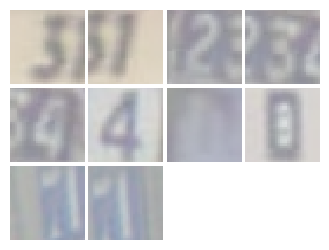

Iter: 5500, D: 1.268, G:0.8089


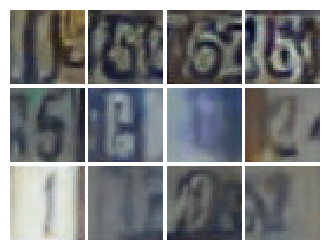

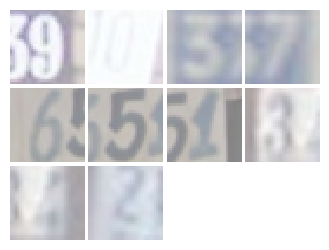

Iter: 5750, D: 1.291, G:0.864


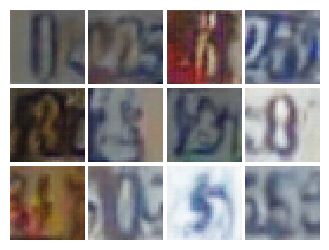

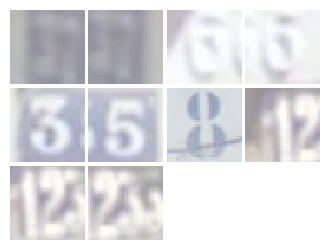

Iter: 6000, D: 1.295, G:0.9614


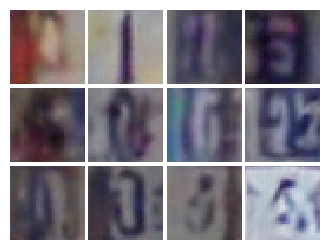

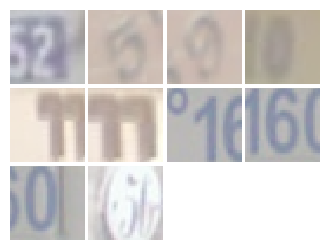

Iter: 6250, D: 1.276, G:0.8694


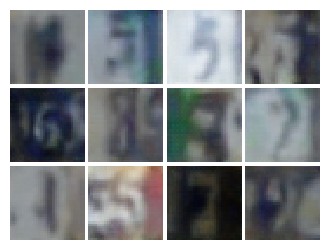

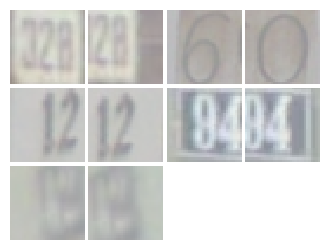

Iter: 6500, D: 1.286, G:0.96


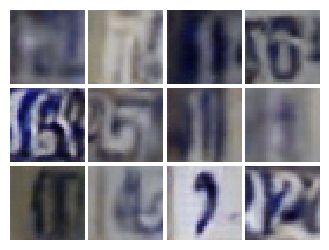

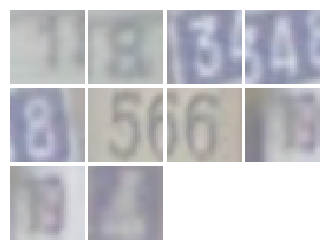

Iter: 6750, D: 1.295, G:0.7392


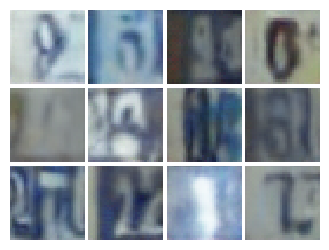

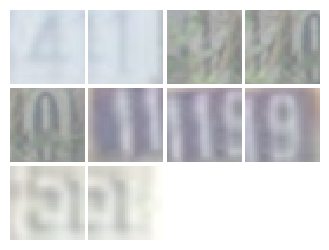

Iter: 7000, D: 1.216, G:0.8771


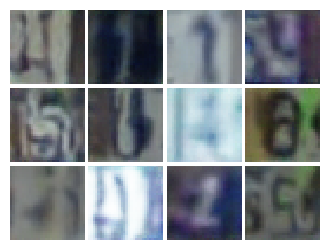

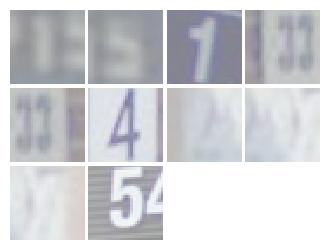

Iter: 7250, D: 1.229, G:0.7996


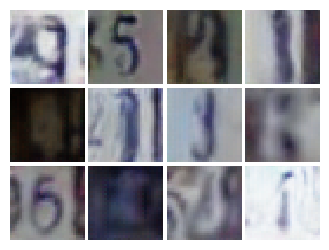

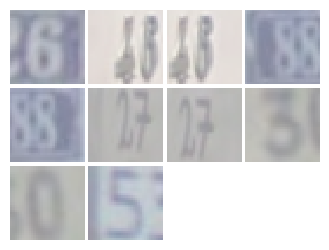

Iter: 7500, D: 1.234, G:0.817


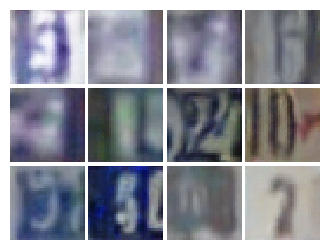

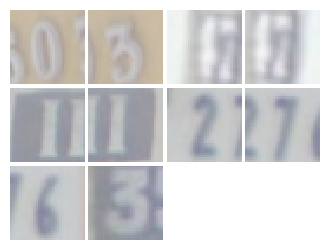

Iter: 7750, D: 1.227, G:0.8895


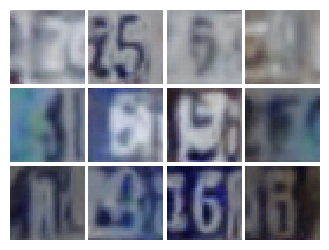

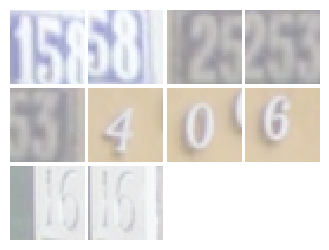

Iter: 8000, D: 1.255, G:0.7859


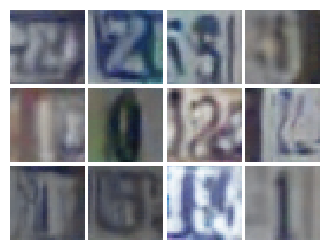

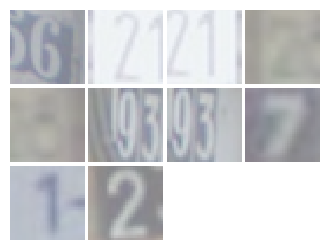

Iter: 8250, D: 1.277, G:0.8384


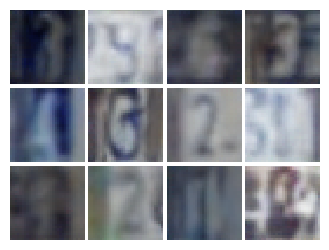

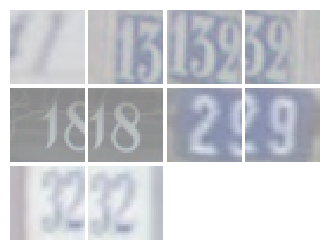

Iter: 8500, D: 1.256, G:0.8451


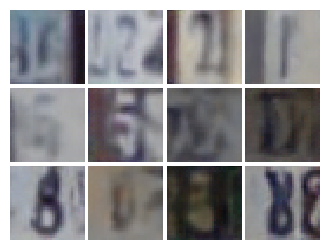

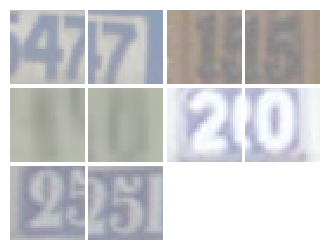

Iter: 8750, D: 1.252, G:0.8748


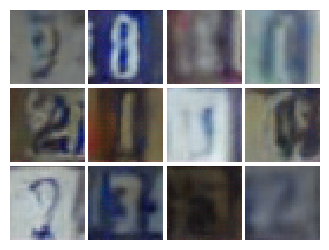

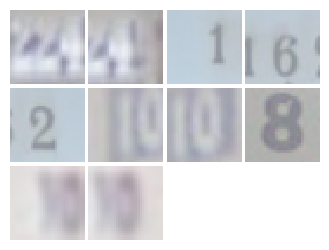

Iter: 9000, D: 1.187, G:0.9177


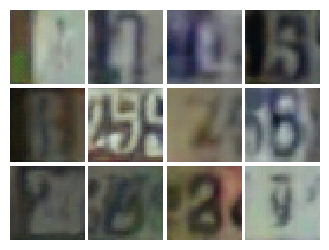

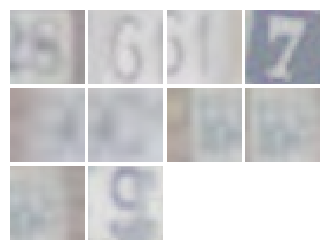

Iter: 9250, D: 1.224, G:0.9501


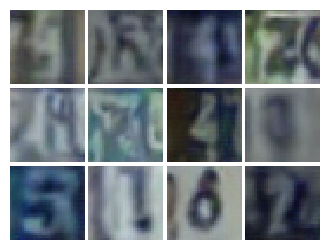

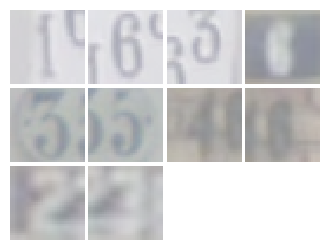

Iter: 9500, D: 1.203, G:0.9683


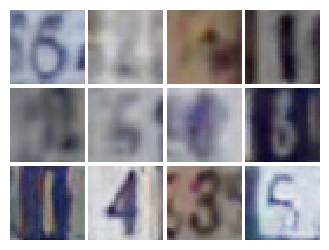

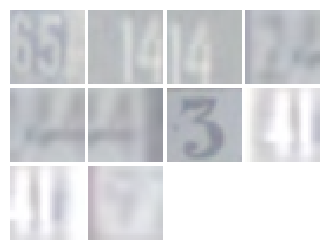

Iter: 9750, D: 1.259, G:0.8149


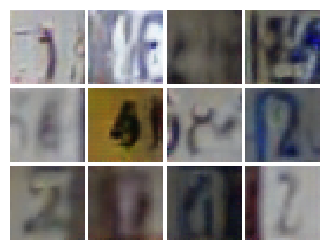

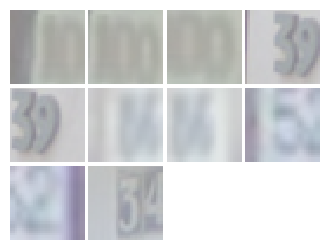

Iter: 10000, D: 1.235, G:1.039


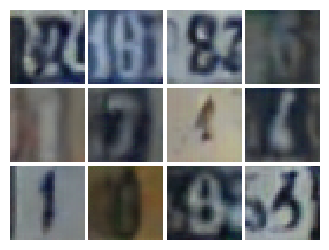

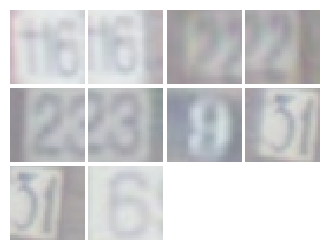

Iter: 10250, D: 1.176, G:0.9746


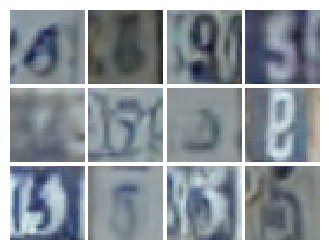

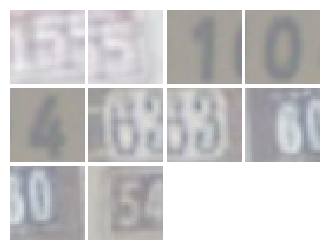

Iter: 10500, D: 1.19, G:0.8573


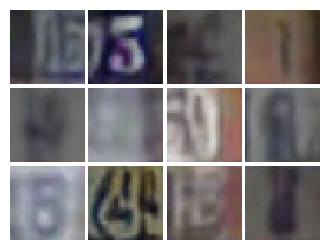

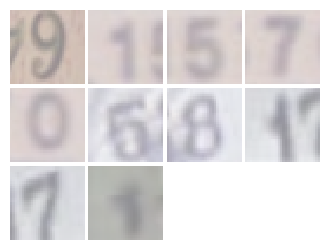

Iter: 10750, D: 1.213, G:0.9841


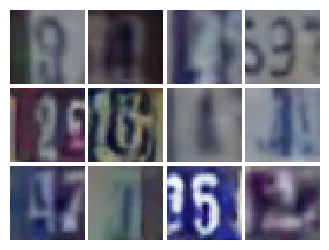

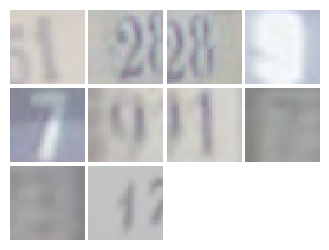

Iter: 11000, D: 1.25, G:0.9888


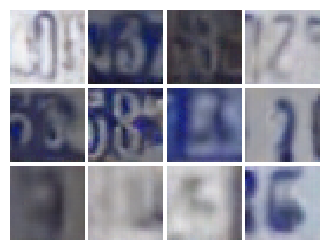

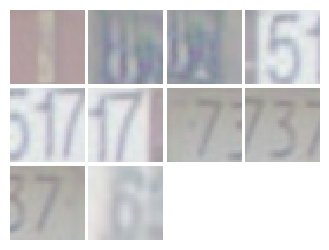

Iter: 11250, D: 1.207, G:1.028


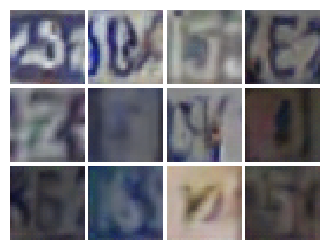

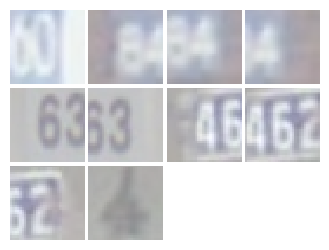

Iter: 11500, D: 1.212, G:0.9477


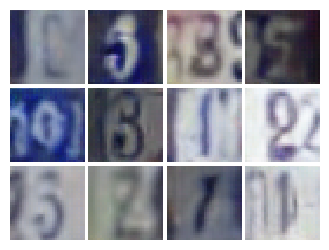

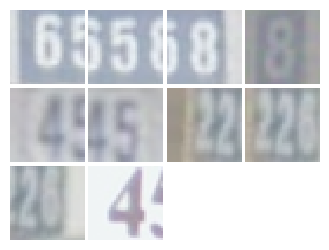

Iter: 11750, D: 1.149, G:0.9482


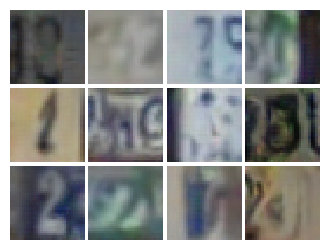

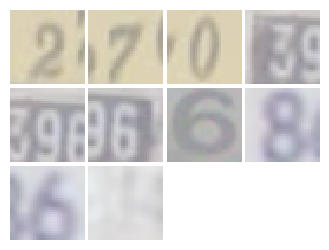

Iter: 12000, D: 1.355, G:0.8204


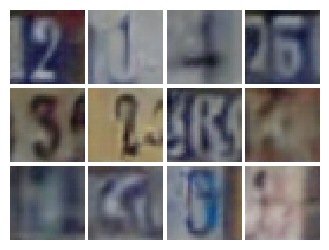

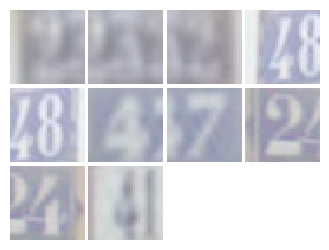

Iter: 12250, D: 1.133, G:1.457


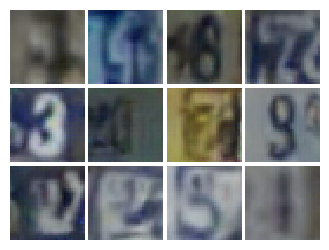

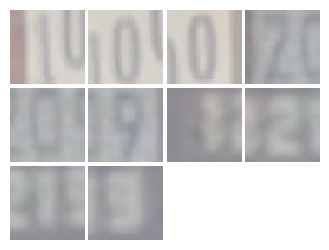

Iter: 12500, D: 1.156, G:0.9355


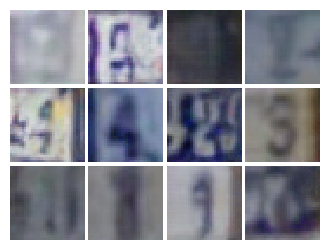

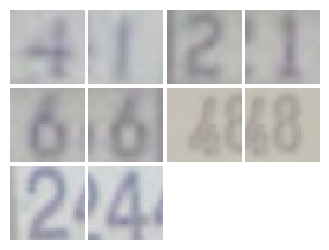

Iter: 12750, D: 1.197, G:1.061


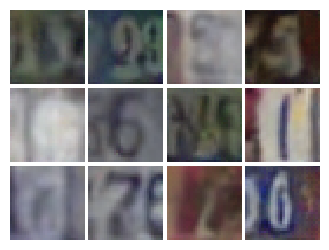

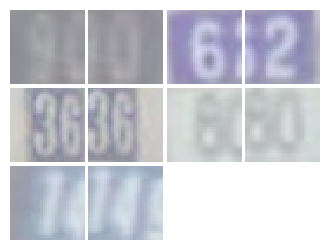

Iter: 13000, D: 1.226, G:0.8913


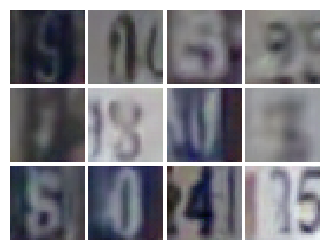

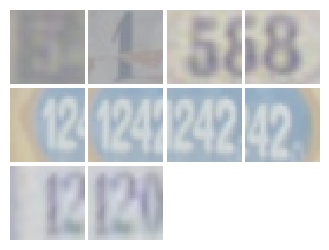

Iter: 13250, D: 1.191, G:0.919


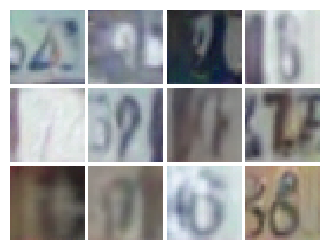

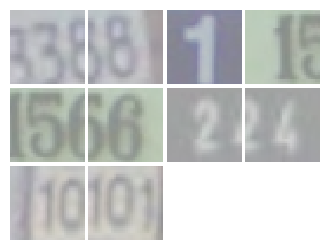

Iter: 13500, D: 1.254, G:0.8886


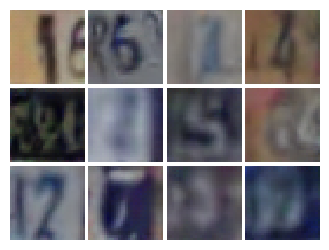

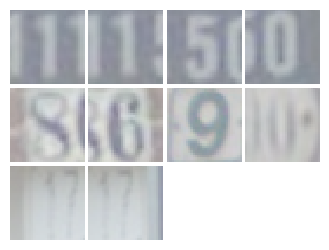

Iter: 13750, D: 1.18, G:0.9944


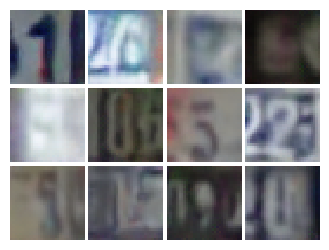

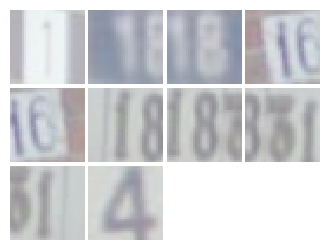

Iter: 14000, D: 1.179, G:0.8877


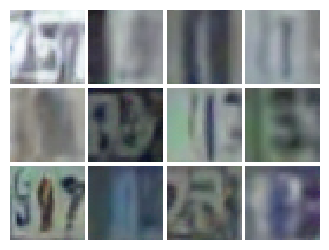

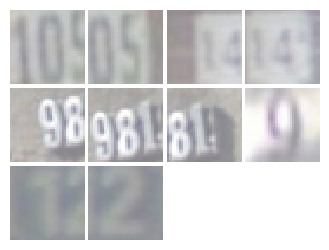

Iter: 14250, D: 1.241, G:0.845


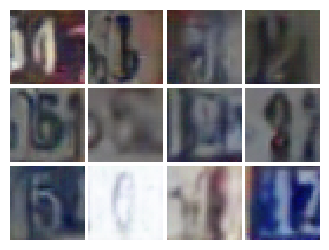

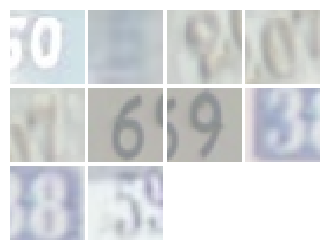

Iter: 14500, D: 1.11, G:0.997


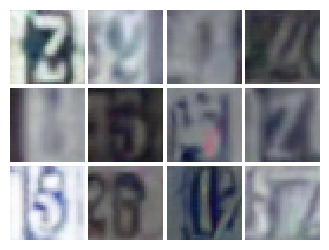

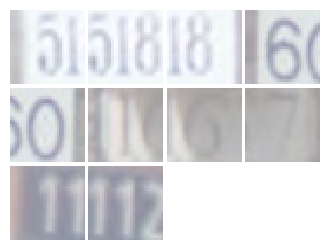

Iter: 14750, D: 1.166, G:0.9915


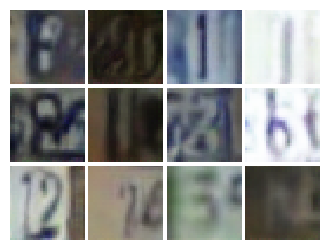

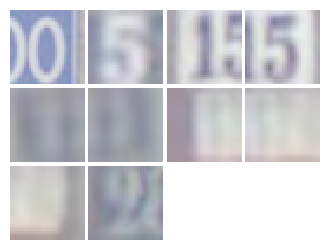

Iter: 15000, D: 1.219, G:1.036


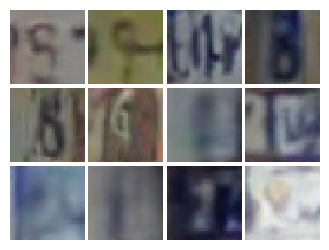

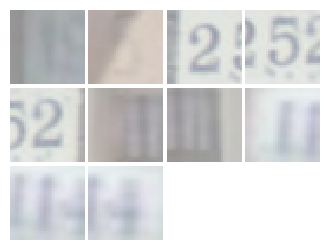

Iter: 15250, D: 1.15, G:1.28


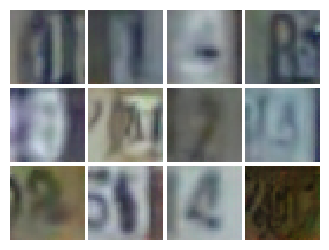

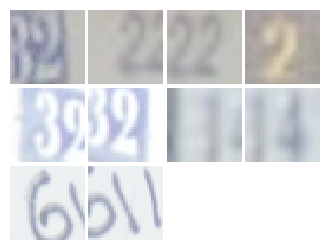

Iter: 15500, D: 1.19, G:1.057


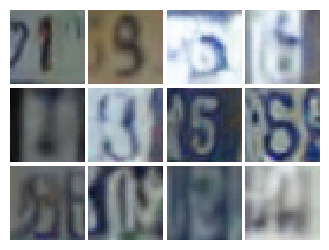

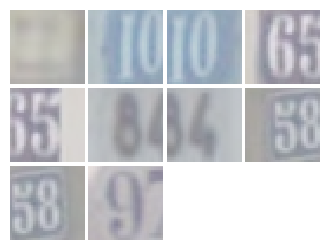

Iter: 15750, D: 1.017, G:1.004


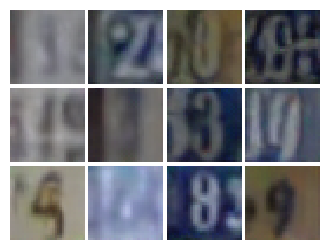

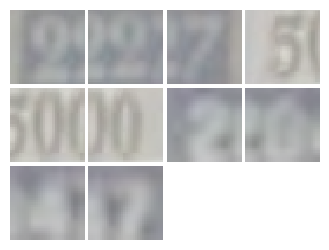

Iter: 16000, D: 1.216, G:0.9864


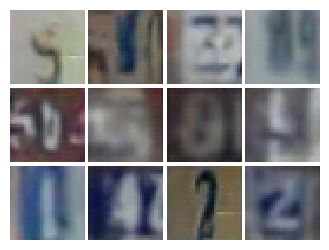

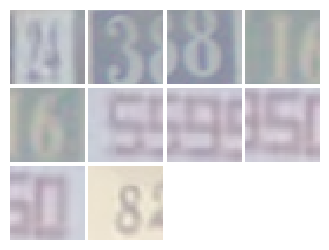

Iter: 16250, D: 1.207, G:0.9779


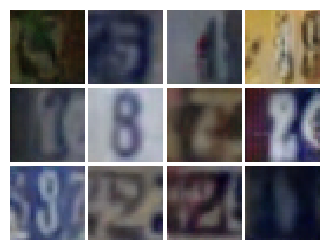

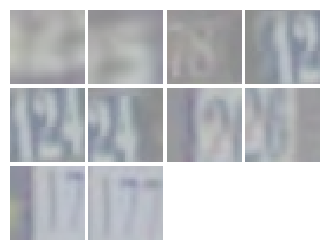

Iter: 16500, D: 2.52, G:0.4395


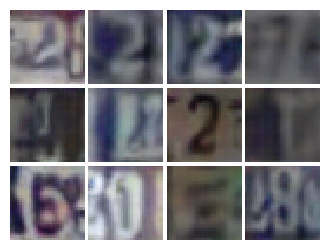

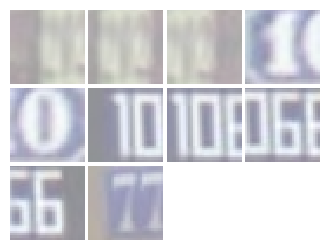

Iter: 16750, D: 1.216, G:1.02


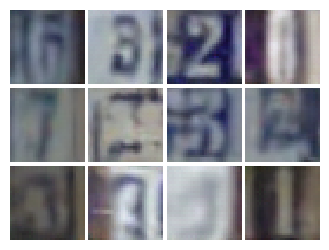

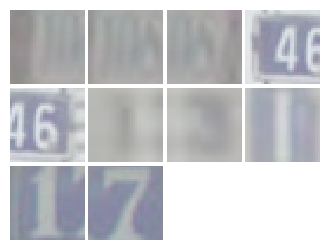

Iter: 17000, D: 0.9858, G:1.952


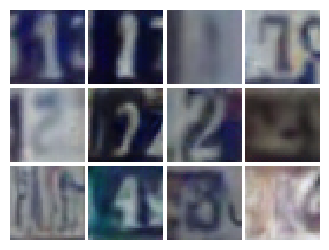

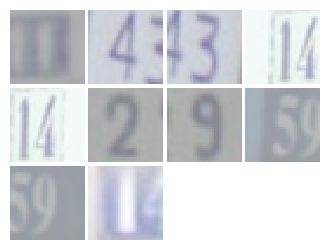

Iter: 17250, D: 1.228, G:0.9423


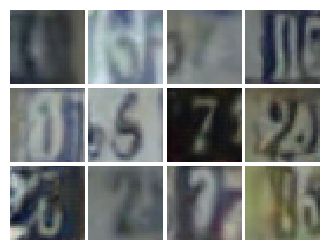

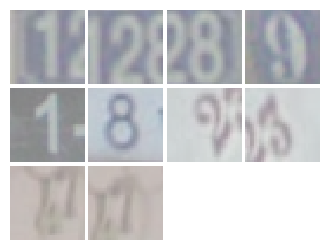

Iter: 17500, D: 1.226, G:1.369


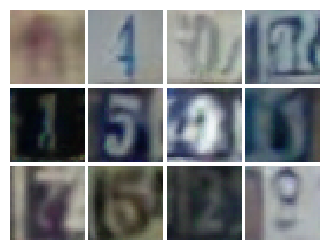

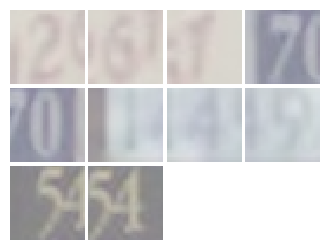

Iter: 17750, D: 1.197, G:0.9134


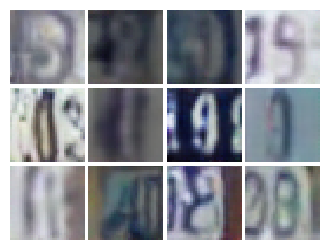

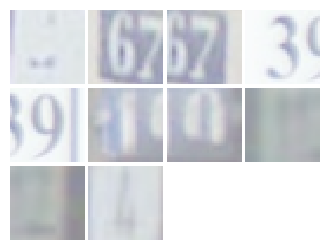

Iter: 18000, D: 1.211, G:1.013


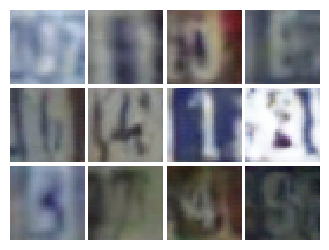

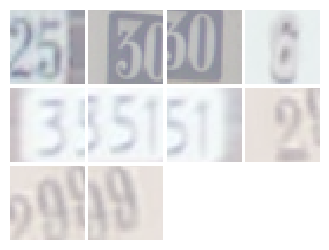

Iter: 18250, D: 0.9801, G:1.168


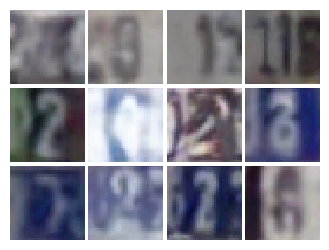

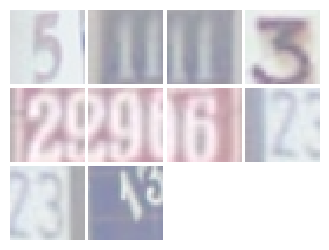

Iter: 18500, D: 0.7409, G:1.483


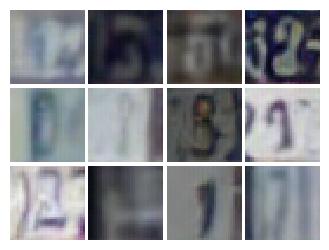

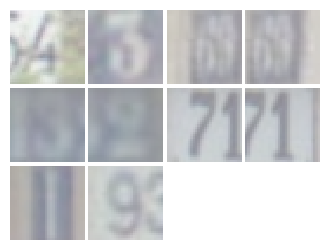

Iter: 18750, D: 1.22, G:1.053


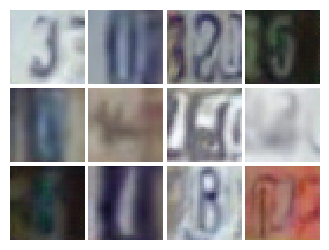

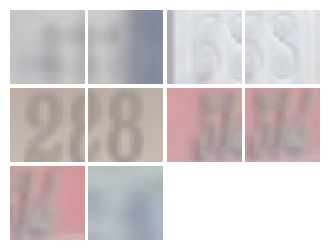

Iter: 19000, D: 1.185, G:0.957


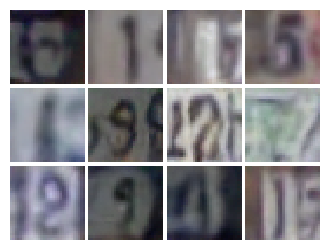

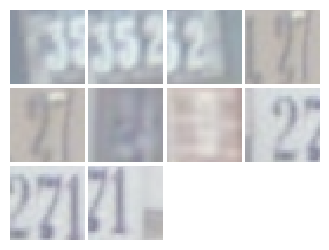

Iter: 19250, D: 1.038, G:1.141


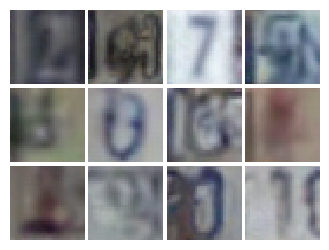

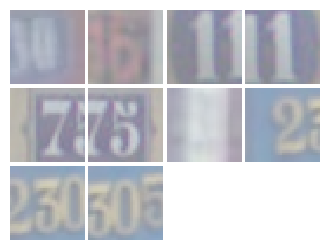

Iter: 19500, D: 1.196, G:1.03


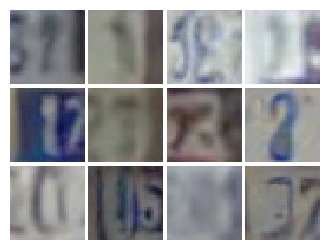

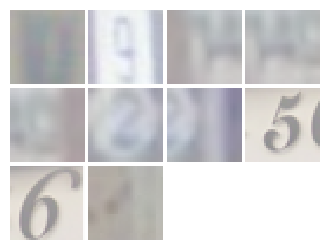

Iter: 19750, D: 1.199, G:1.099


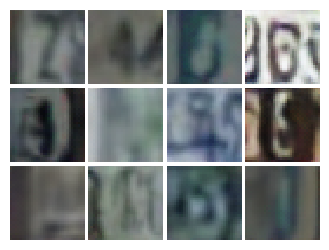

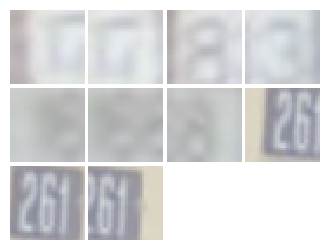

Iter: 20000, D: 1.148, G:1.112


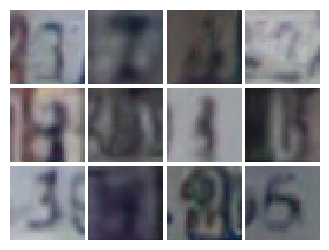

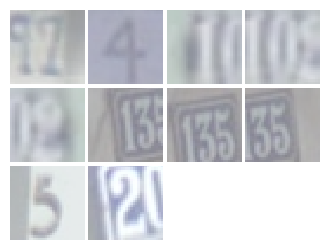

Iter: 20250, D: 1.163, G:1.165


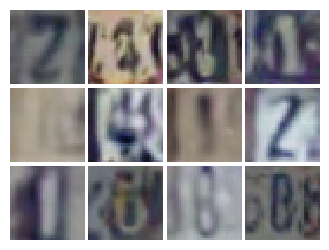

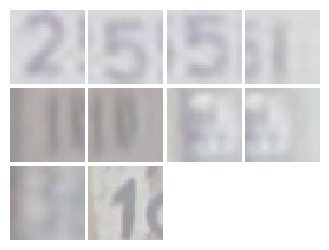

Iter: 20500, D: 1.215, G:1.026


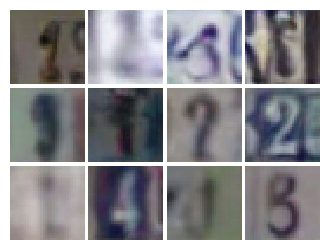

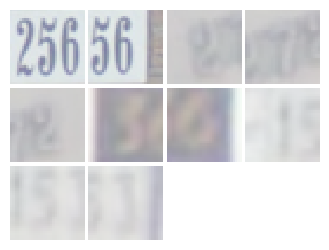

Iter: 20750, D: 1.141, G:0.9946


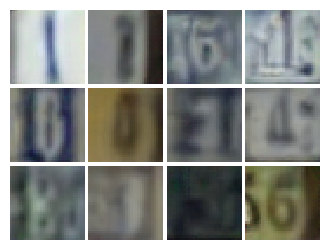

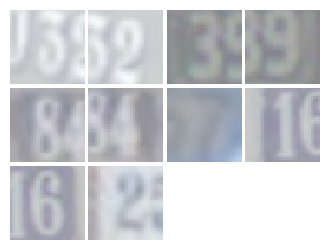

Iter: 21000, D: 1.149, G:1.047


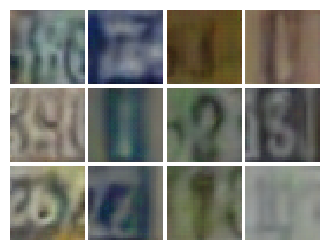

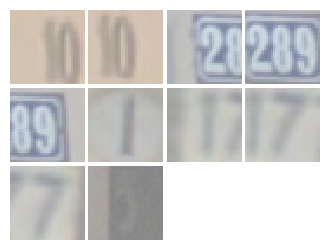

Iter: 21250, D: 1.08, G:1.042


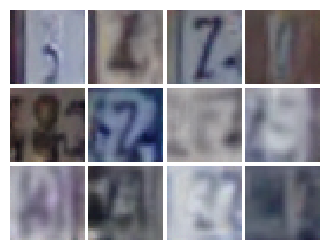

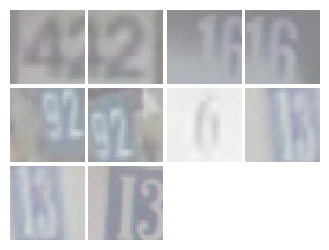

Iter: 21500, D: 1.161, G:0.9865


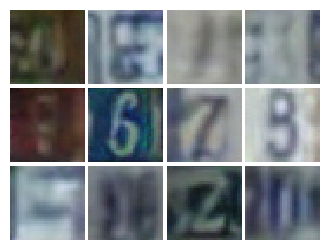

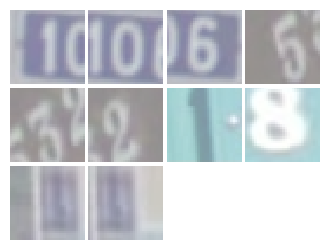

Iter: 21750, D: 1.11, G:1.036


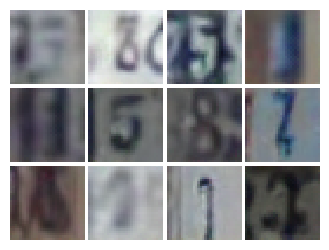

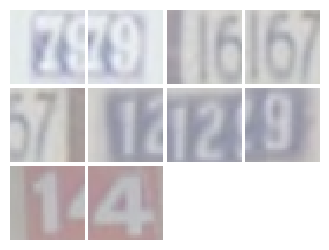

Iter: 22000, D: 1.208, G:1.045


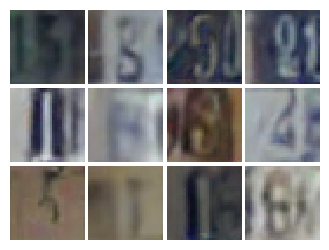

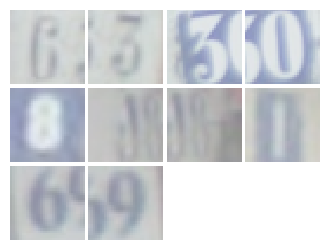

Iter: 22250, D: 1.179, G:1.011


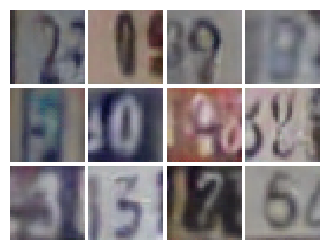

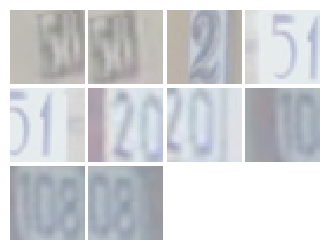

Iter: 22500, D: 1.111, G:1.148


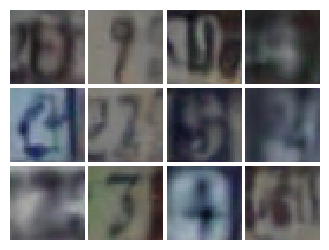

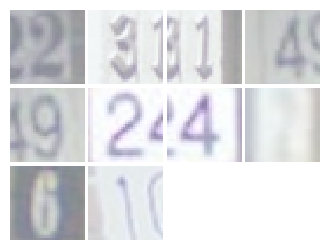

Iter: 22750, D: 1.052, G:0.9951


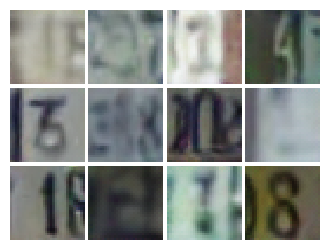

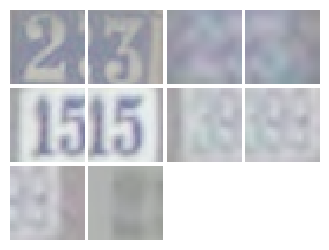

Iter: 23000, D: 1.157, G:0.8905


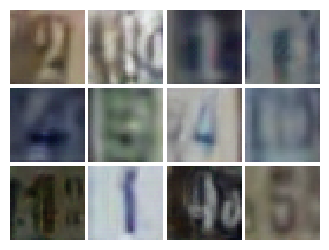

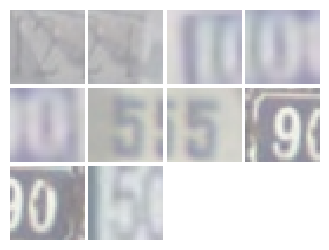

Iter: 23250, D: 0.9124, G:1.235


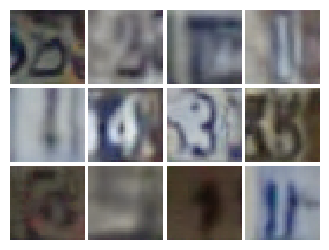

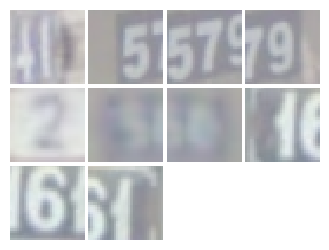

Iter: 23500, D: 1.112, G:1.085


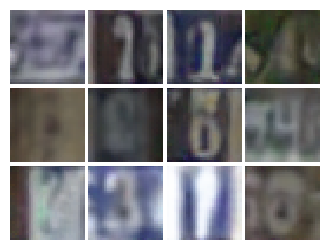

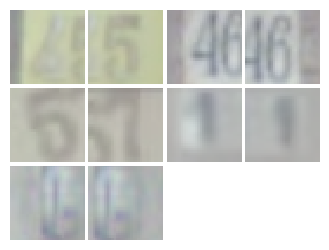

Iter: 23750, D: 1.022, G:1.122


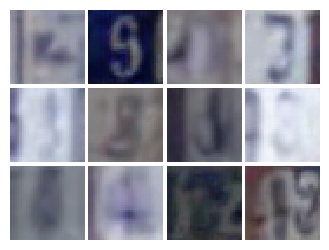

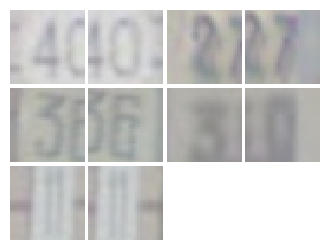

Iter: 24000, D: 1.039, G:1.093


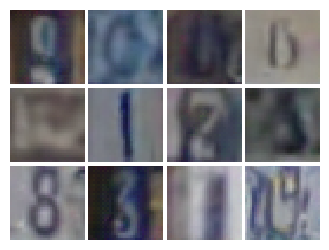

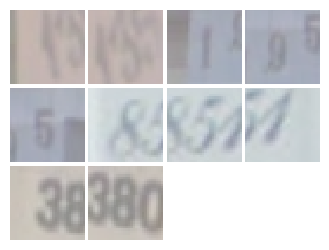

Iter: 24250, D: 1.189, G:1.012


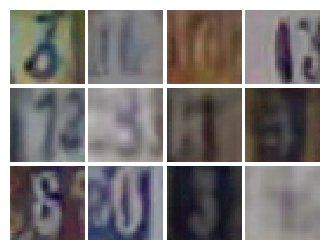

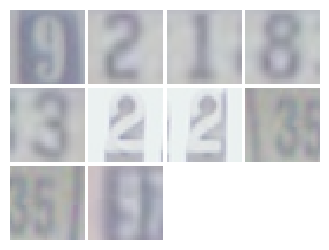

Iter: 24500, D: 1.18, G:0.9307


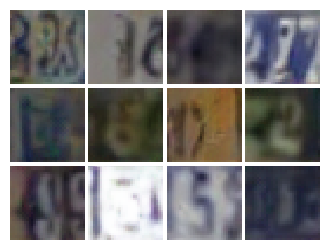

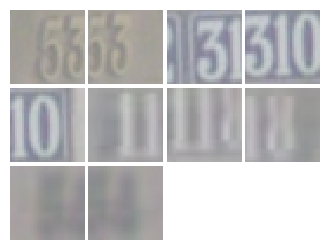

Iter: 24750, D: 1.066, G:1.115


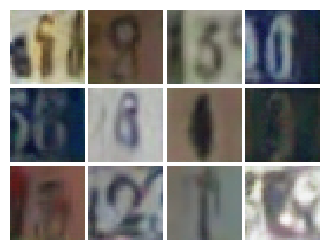

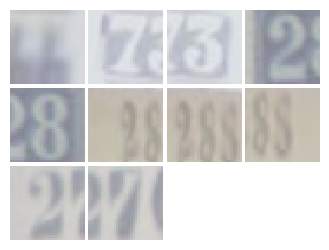

Iter: 25000, D: 1.119, G:1.116


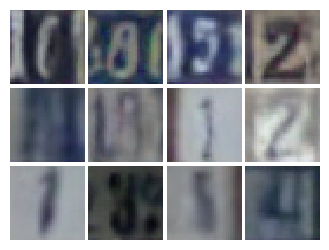

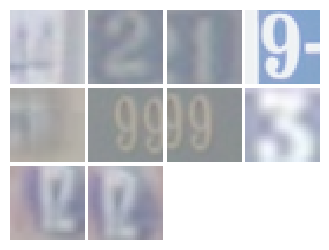

Iter: 25250, D: 1.137, G:0.957


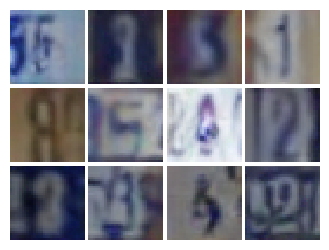

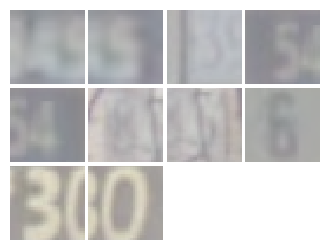

Iter: 25500, D: 1.053, G:1.326


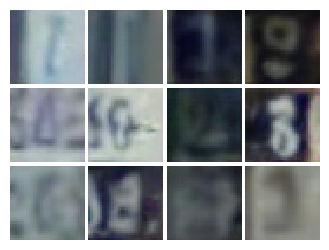

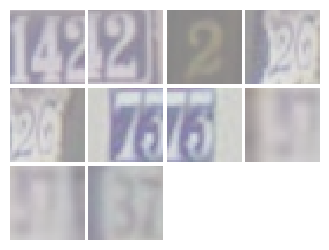

Iter: 25750, D: 1.116, G:1.343


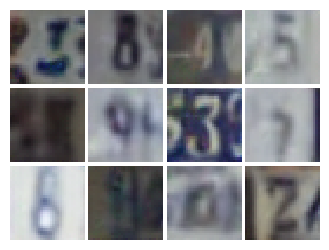

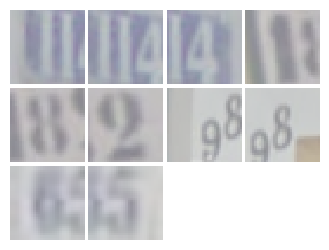

Iter: 26000, D: 0.8861, G:1.008


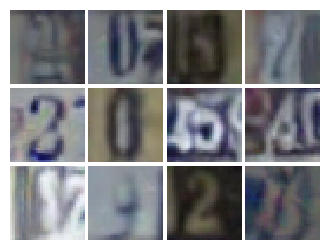

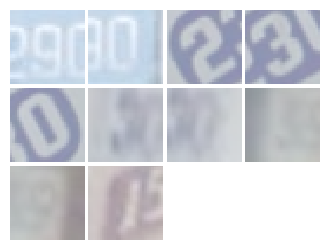

Iter: 26250, D: 1.054, G:1.023


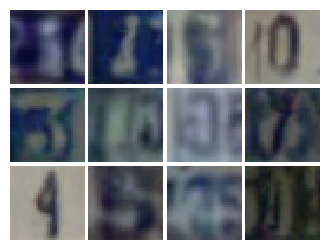

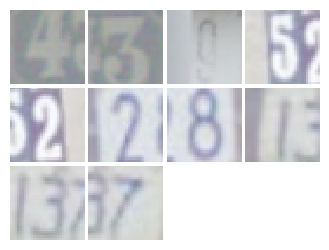

Iter: 26500, D: 1.114, G:1.134


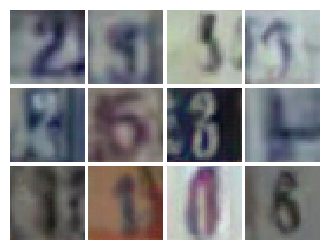

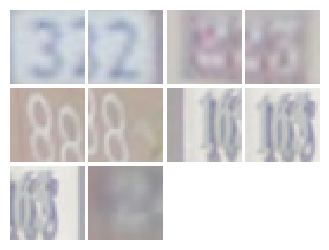

Iter: 26750, D: 1.175, G:0.9634


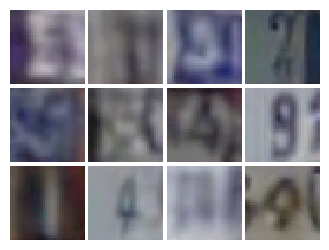

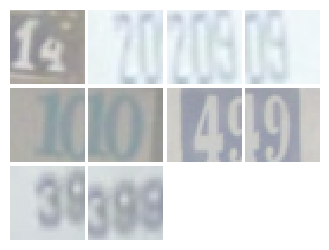

Iter: 27000, D: 1.076, G:1.064


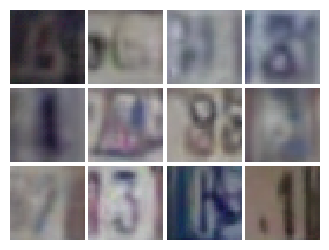

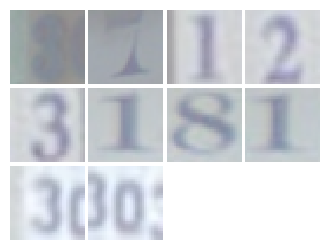

Iter: 27250, D: 1.019, G:1.083


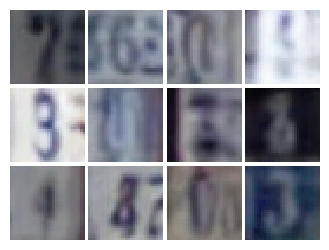

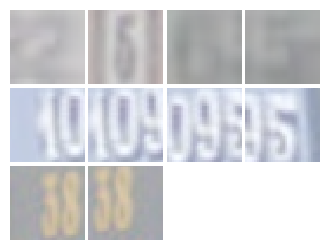

Iter: 27500, D: 1.092, G:0.9876


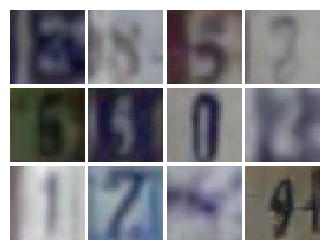

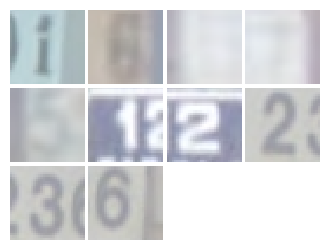

Iter: 27750, D: 0.9929, G:1.71


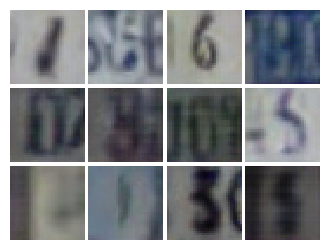

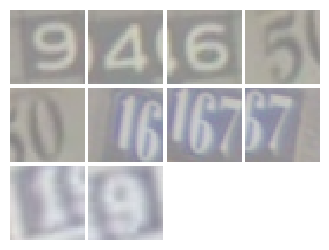

Iter: 28000, D: 1.149, G:1.21


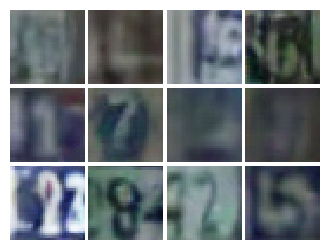

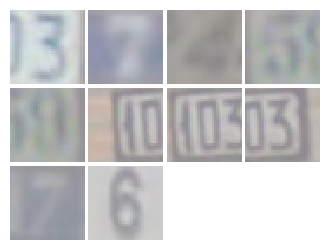

Iter: 28250, D: 0.9951, G:1.153


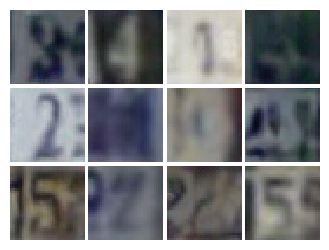

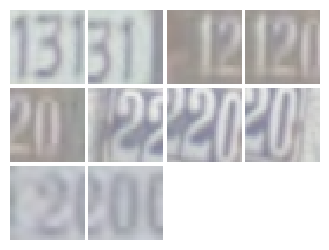

Iter: 28500, D: 1.214, G:1.092


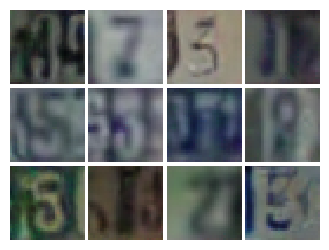

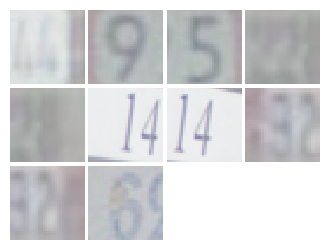

In [11]:
from part1_GANs.gan_pytorch import get_optimizer, train_gan

# Make the discriminator
D = discriminator().type(dtype)

# Make the generator
G = generator().type(dtype)

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = get_optimizer(D)
G_solver = get_optimizer(G)

batch_size = 256

loader_train = DataLoader(
    svhn_train,
    batch_size=batch_size,
    sampler=ChunkSampler(len(svhn_train), 0)
)

# Run it!
images = train_gan(
    D,
    G,
    D_solver,
    G_solver,
    discriminator_loss,
    generator_loss,
    loader_train,
    batch_size = batch_size,
    noise_size=96,
    num_epochs=100
)

### You do not have to save the above training images for your final report, please just save the images generated by the cell below

Iter: 0


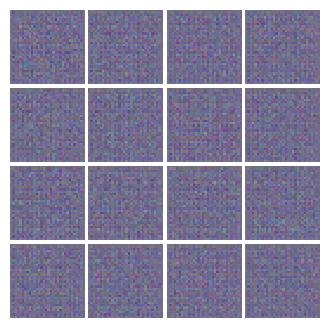

Iter: 49000


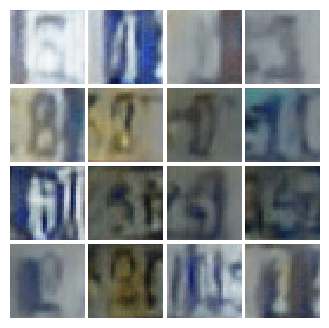

Iter: 98000


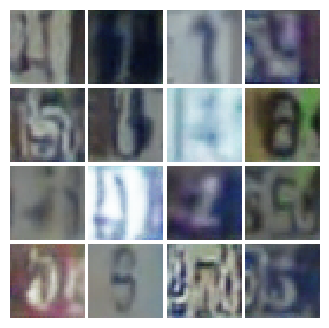

Iter: 147000


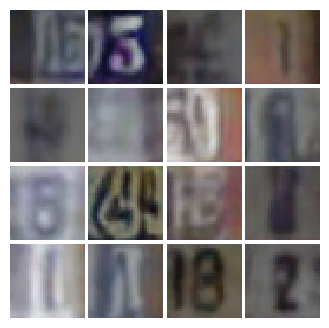

Iter: 196000


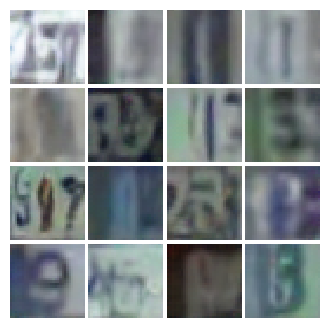

Iter: 245000


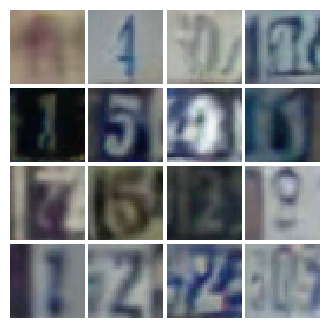

Iter: 294000


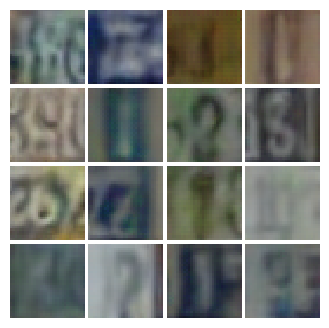

Iter: 343000


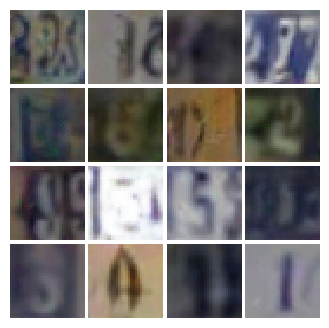

Iter: 392000


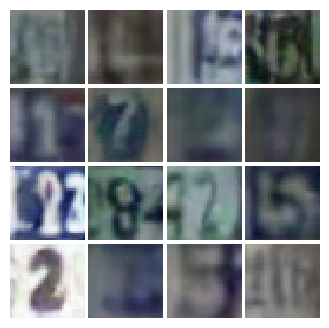

In [12]:
numIter = 0
if len(images) > 8:
    step = len(images) // 8
else:
    step = 1

for i in range(0, len(images), step):
    img = images[i]
    numIter = 250 * i * step
    print("Iter: {}".format(numIter))
    img = (img)/2 + 0.5
    show_images(img.reshape(-1, 3, 32, 32))
    plt.show()


## [TODO] GAN Output Visual Evaluation [2pts (Report)]
The main deliverable for this notebook is the final GAN generations!  Run the cells in this section to show your final output.  If you are unhappy with the generation, feel free to train for longer.  Keep in mind we are not expecting perfect outputs, especially considering your limited computation resources.  Below we have shown a few example images of what acceptable and unacceptable outputs are.  Make sure your final image displays and is included in the report.
\
\
Acceptable Output:

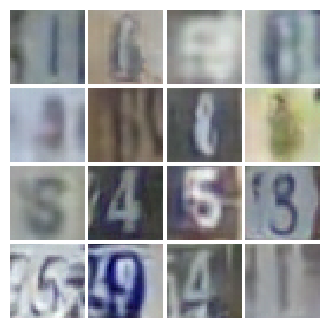

Unreasonable Output:


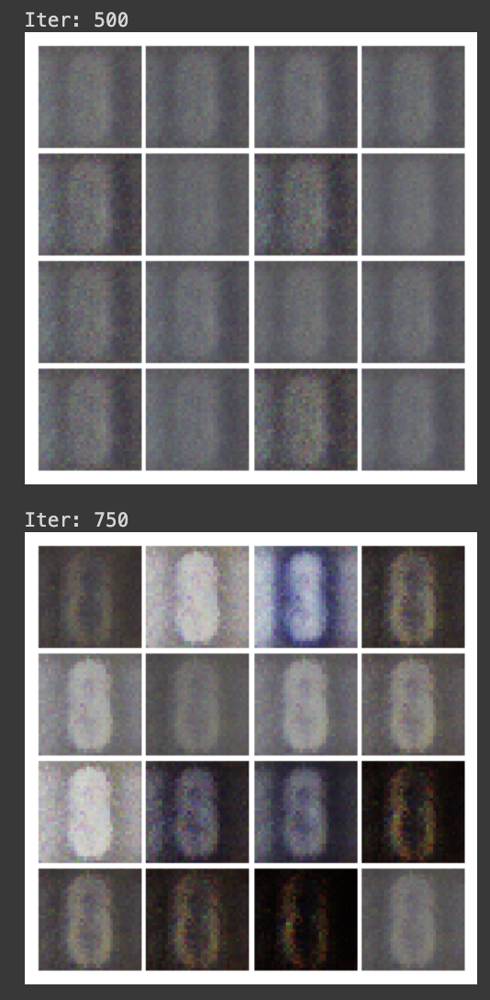

Vanilla GAN final image:


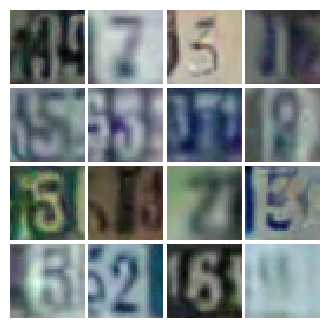

In [13]:
# This output is your answer - please include in the final report
print("Vanilla GAN final image:")
fin = (images[-1] - images[-1].min()) / (images[-1].max() - images[-1].min())
show_images(fin.reshape(-1, 3, 32, 32))
plt.show()

# Reflections (2 Points)

## [TODO]: Reflect on the GAN Training Process. What were some of the difficulties? How good were the generated outputs?

After understanding the structure of how the training should happen, the difficulties were a matter of tuning (although I relied on the suggested hyperparameters in the notebook, the network's architecture was still flexible).

For my first try, I just followed the suggestions for both discriminator and generator, and after knowing that my code was running smooth I experimented with the addition of batchnorm layers (following hte guidelines of https://arxiv.org/pdf/1511.06434.pdf).

The outputs were not perfect, but not bad. In a qualitative look, some generated images are very similar to the ones from the training set, and could even fool me. 

## [TODO] What is a mode collapse in GAN training, can you find any examples in your training?

Mode collapse in GAN training is when the outputs of the generator is not reflective of the actual dataset in the sense of not being as diverse. The symptoms are not being able to generate all the available "labels", or only being able to output that is very close to the training set. It basically means that the generator was not able to learn the "meaning" of all of the data.

Yes. Despite not having quantitative results, I can see that the generator tends to output certain numbers more than others. For example, the numbers 4 and 9 are barely seen.

## [TODO] Talk about the trends that you see in the losses for the generator and the discriminator.  Explain why those values might make sense given the quality of the images generated after a given number of itterations.

I see a cyclic trend that the losses follow: in an iteration where the discriminator loss goes down, the generator loss goes up; when the generator loss goes down, the discriminator loss goes up. It makes sense because they are two competing networks. The way I see it, as the discriminator gets better, the generator has a harder time to fool it, and when it does, then the discriminator will fight against that. 

Because of that it makes sense that the losses don't just go down as they usually do for common classification tasks, but instead they bounce around some number (in my case between 0.7 and 1.6).

## Saving Models

In [17]:
# You must save these models to run the next cells
torch.save(D.state_dict(), "d_smart.pth")
torch.save(G.state_dict(), "g_smart.pth")

# Evaluating GANS

## Evaluating via FID Score

It is hard to evaluate GANs effectiveness quantiatively. One way we can do this is by calculating FID (Frechet-Inception-Distance).

<!-- Read more about what it is and implement it. Two function headers are provided for you: `calculate_inception_features` and `calculate_fid`.

`calculate_inception_features`: This function is to get the features by running Inception v3

`calculate_fid`: This function uses the real and fake features to calculate the FID score -->

Website: https://wandb.ai/ayush-thakur/gan-evaluation/reports/How-to-Evaluate-GANs-using-Frechet-Inception-Distance-FID---Vmlldzo0MTAxOTI

But for this assignment, we will visually evaluate the GAN outputs.

## TODO: Evaluating Discriminator

*Not graded* but for fun see how well your discriminator does against a sample generator.

In [18]:
from part1_GANs.gan_pytorch import get_optimizer, eval_gan, eval_discriminator
from part1_GANs.gan_pytorch import generator, discriminator, discriminator_loss, generator_loss

D = discriminator().type(dtype)
D.load_state_dict(torch.load("d_smart.pth"))
D.eval()

# oracle_g = torch.jit.load("../test_resources/g_smart_o.pt")
oracle_g = torch.jit.load("test_resources/g_smart_o.pt")
oracle_g.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

accuracy, p, r = eval_discriminator(D, oracle_g, loader_val, device)

# Test accuracy is greater than 0.55
assert accuracy > 0.55


Accuracy: 0.6543386530748663
Precision: 0.9170792402673282
Recall: 0.3265662854289002


## Preparing for Submission

Run the following cell to collect ```hw4_submission_part1.zip```.  You will submit this to HW4: Part 2 - GANs on gradescope.  Make sure to also export a PDF of this jupyter notebook and attach that to the end of your theory section.  This PDF must show your answers to all the questions in the document, please include the final photos that you generate as well.  Do not include all of your training images!  You will not be given credit for anything that is not visible to us in this PDF.

In [16]:
!sh collect_submission_part1.sh

sh: 0: cannot open collect_submission_part1.sh: No such file


*Contributers*
- Manav Agrawal (Lead)
- Matthew Bronars
- Mihir Bafna